<a href="https://colab.research.google.com/github/JohnTichenor/Locating-Bacterial-Flagellar-Motors/blob/main/Faster_RCNN_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [35]:
!pip install torch torchvision
!pip install tqdm

## Import Dependencies

In [36]:
import torch
from torch.utils.data import DataLoader
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.datasets import ImageFolder
from torchvision import transforms
import torchvision.transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms
import torchvision.transforms.v2 as T
from torch.utils.data import random_split
from torch.utils.data import Dataset
from PIL import Image

## Mount Drive

In [37]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## Load Data

In [38]:
TRAIN_DIR = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/train"
TEST_DIR = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/test"
LABELS_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/train_labels.csv"
SUBMIT_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/submission.csv"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Create Bounding Boxes

In [90]:
import pandas as pd
import json
import os


def create_motor_bounding_boxes(csv_path, output_json_path, box_size=32):
    """
    Convert 3D motor coordinates into 2D bounding boxes and save as JSON.
    For slices with no motor, adds an empty list (no bounding boxes).

    Args:
        csv_path (str): Path to the CSV file with motor annotations.
        output_json_path (str): Path to save the output JSON file.
        box_size (int): Width/height of the bounding box (in pixels). Default is 32.

    Returns:
        str: Path to the saved JSON file.
    """
    if os.path.exists(output_json_path):
        print(f"⚠️ JSON already exists at '{output_json_path}'. Skipping creation.")
        return output_json_path

    df = pd.read_csv(csv_path)
    half = box_size // 2
    bbox_dict = {}

    for _, row in df.iterrows():
        z = row["Motor axis 0"]
        y = row["Motor axis 1"]
        x = row["Motor axis 2"]
        tomo_id = row["tomo_id"]
        has_motor = row.get("Has motor", 1)  # Default to 1 if not present

        if has_motor == 0 or z < 0 or x < 0 or y < 0:
            # No motor: empty list for this image
            image_filename = f"{tomo_id}/slice_0000.jpg"
            bbox_dict[image_filename] = []
            continue

        image_filename = f"{tomo_id}/slice_{int(z):04d}.jpg"

        # Compute bounding box coordinates centered at (x, y)
        xmin = max(0, int(x - half))
        ymin = max(0, int(y - half))
        xmax = int(x + half)
        ymax = int(y + half)

        # Append annotation for actual motor
        bbox = [xmin, ymin, xmax, ymax]
        label = 1

        if image_filename not in bbox_dict:
            bbox_dict[image_filename] = []

        bbox_dict[image_filename].append({"bbox": bbox, "label": label})

    # Write to JSON
    with open(output_json_path, "w") as f:
        json.dump(bbox_dict, f, indent=2)

    return output_json_path

# Bounding Box Output Path "bounding_boxes_<box_size>.json"
bounding_boxes_json = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32_v2.json"

create_motor_bounding_boxes(LABELS_PATH, bounding_boxes_json, box_size=32)

'/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32_v2.json'

In [92]:
import json

with open ("/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/bounding_boxes_32_v2.json") as f:   # Replace with your filename
    bbox_dict = json.load(f)

# Extract folder names from each image path
folders = set(path.split('/')[0] for path in bbox_dict.keys())
print("Number of unique tomogram folders referenced:", len(folders))
print("Sample folders:", list(folders)[:10])


Number of unique tomogram folders referenced: 648
Sample folders: ['tomo_41ea80', 'tomo_b54396', 'tomo_7036ee', 'tomo_b2eb0c', 'tomo_b8595d', 'tomo_736dfa', 'tomo_6c5a26', 'tomo_d723cd', 'tomo_fb6ce6', 'tomo_68e123']


## Draw Boxes

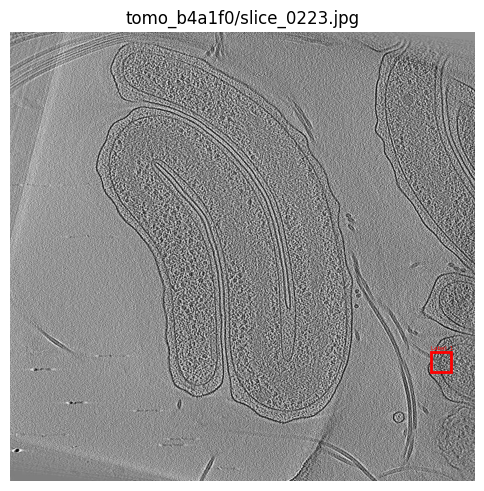

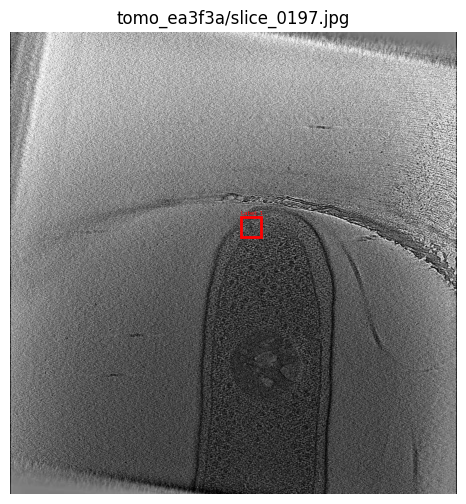

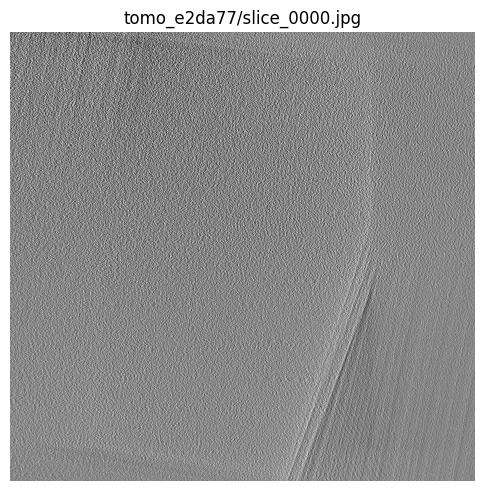

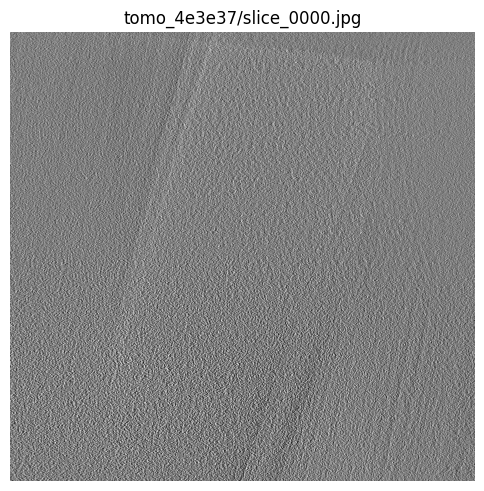

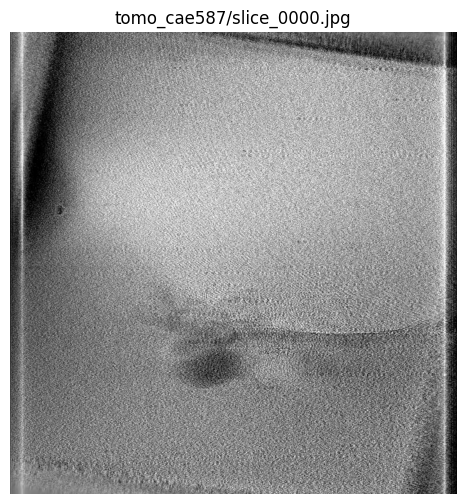

...

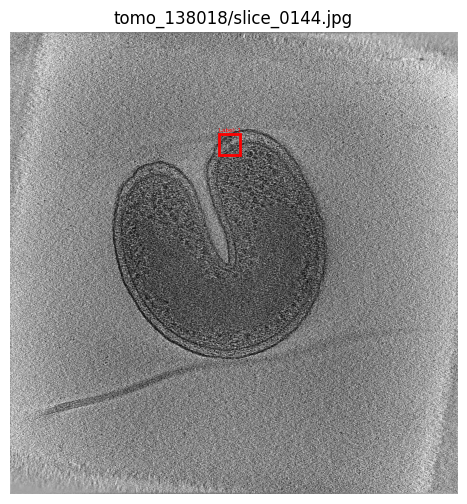

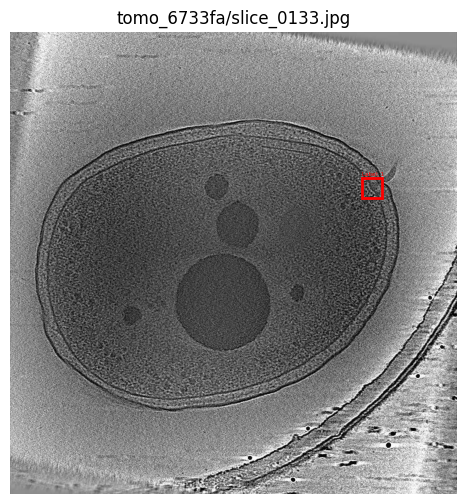

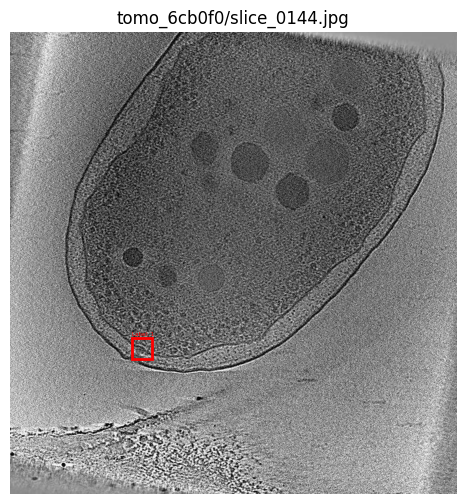

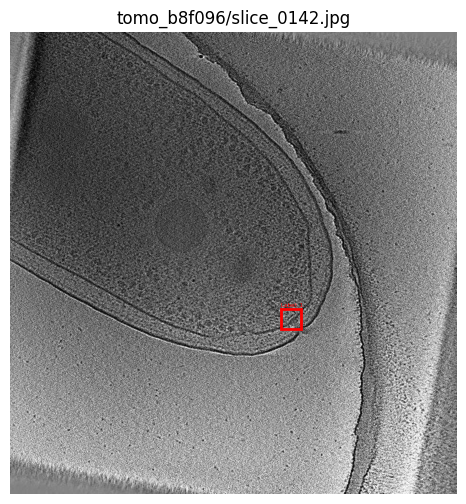

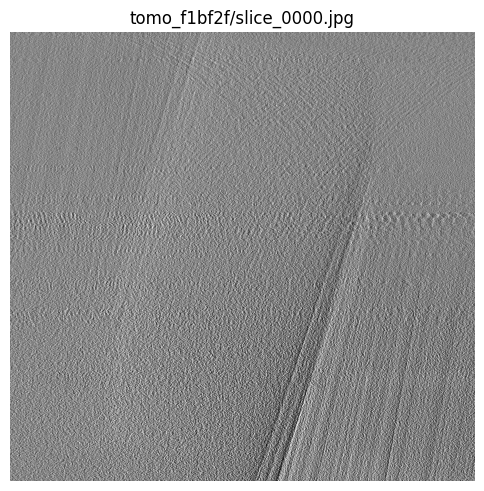

In [93]:
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_bounding_boxes(json_path, root_dir, n=5, padding = 0):
    """
    Visualize bounding boxes from JSON on randomly selected image slices.

    Args:
        json_path (str): Path to the JSON file containing bounding boxes.
        root_dir (str): Root directory containing image folders (e.g., tomo_id/slice_xxxx.jpg).
        n (int): Number of images to visualize.
    """
    # Load the bounding box annotations
    with open(json_path, "r") as f:
        bbox_dict = json.load(f)

    # Select random N image filenames
    image_files = random.sample(list(bbox_dict.keys()), min(n, len(bbox_dict)))

    for img_rel_path in image_files:
        img_path = os.path.join(root_dir, img_rel_path)
        if not os.path.exists(img_path):
            print(f"Image not found: {img_path}")
            continue

        img = Image.open(img_path).convert("RGB")

        # Plot the image
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        ax = plt.gca()

        for ann in bbox_dict[img_rel_path]:
          xmin, ymin, xmax, ymax = ann["bbox"]
          # Expand box for visualization
          xmin_p = max(xmin - padding, 0)
          ymin_p = max(ymin - padding, 0)
          xmax_p = min(xmax + padding, img.width)
          ymax_p = min(ymax + padding, img.height)

          rect = plt.Rectangle(
              (xmin_p, ymin_p), xmax_p - xmin_p, ymax_p - ymin_p,
              linewidth=2, edgecolor='red', facecolor='none'
          )
          ax.add_patch(rect)
          ax.text(xmin_p, ymin_p - 5, f"Label: {ann['label']}", color='red', fontsize=4)

        plt.title(img_rel_path)
        plt.axis("off")
        plt.show()

visualize_bounding_boxes(
    json_path=bounding_boxes_json,
    root_dir=TRAIN_DIR,
    n=15,  # View 15 images
    padding=5 #Large box around motor for better visual of motor
)


# Format the Dataset

In [102]:

class TomogramDataset(Dataset):
    def __init__(self, root_dir, json_path, transforms=None):
        """
        root_dir: path to the folder containing tomogram subfolders
        json_path: bounding box annotations (from motor_bounding_boxes.json)
        """
        self.root_dir = root_dir
        self.transforms = transforms

        with open(json_path) as f:
            self.annotations = json.load(f)

        self.image_paths = list(self.annotations.keys())  # e.g., tomo_00e047/slice_0169.jpg

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        rel_path = self.image_paths[idx]
        img_path = os.path.join(self.root_dir, rel_path)

        image = Image.open(img_path).convert("RGB")

        boxes = torch.tensor([ann["bbox"] for ann in self.annotations[rel_path]], dtype=torch.float32)
        labels = torch.tensor([ann["label"] for ann in self.annotations[rel_path]], dtype=torch.int64)

        # Fix for empty boxes: always shape (N, 4), even if N==0
        if boxes.numel() == 0:
            boxes = boxes.reshape(0, 4)
        if labels.numel() == 0:
            labels = labels.reshape(0,)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx]),
            "area": (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]),
            "iscrowd": torch.zeros((len(boxes),), dtype=torch.int64)
        }

        if self.transforms:
          image, target = self.transforms(image, target)

        return image, target

## Transform data and split

In [124]:
generator = torch.Generator().manual_seed(42)

'''
train_transforms = T.Compose([
    T.ToImage(),  # Ensures image type
    T.RandomHorizontalFlip(p=0.5),
    T.RandomVerticalFlip(p=0.5),
    T.RandomApply([T.RandomAffine(degrees=10, scale=(0.95, 1.05), translate=(0.02, 0.02))], p=0.5),
    T.RandomApply([T.RandomRotation(degrees=10)], p=0.3),
    T.ToDtype(torch.float32, scale=True),
    T.Normalize(mean=[0.4832], std=[0.2180])
])
'''

train_transforms = T.Compose([
    T.ToImage(),                      # Ensure input is a torch tensor (C, H, W)
    T.ToDtype(torch.float32, scale=True),  # Converts to float and scales to [0, 1]
    T.Normalize(mean=[0.4832], std=[0.2180]),  # Normalization (grayscale)
])

# Your custom dataset
dataset = TomogramDataset(
    root_dir=TRAIN_DIR,
    json_path=bounding_boxes_json,
    transforms=train_transforms
)

# Suppose you want an 80/20 split:
num_total = len(dataset)
num_train = int(0.8 * num_total)
num_val = num_total - num_train

train_dataset, val_dataset = random_split(dataset, [num_train, num_val], generator=generator)

# Dataloader
train_data_loader = DataLoader(dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
validation_data_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

## Check the train and val batches

In [125]:
used_folders = set()
for rel_path in dataset.image_paths:
    folder = rel_path.split(os.sep)[0]  # or os.path.dirname(rel_path)
    used_folders.add(folder)

print("Number of folders referenced in dataset:", len(used_folders))
print("Sample folders:", list(used_folders)[:10])

root_dir = TRAIN_DIR
folders = [f for f in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, f))]
print("Folders found:", len(folders))

Number of folders referenced in dataset: 648
Sample folders: ['tomo_41ea80', 'tomo_b54396', 'tomo_7036ee', 'tomo_b2eb0c', 'tomo_b8595d', 'tomo_736dfa', 'tomo_6c5a26', 'tomo_d723cd', 'tomo_fb6ce6', 'tomo_68e123']
Folders found: 648


### Define the Model

In [126]:
# Load a pre-trained Faster R-CNN
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Replace the classification head
num_classes = 2  # 1 motor class + 1 background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Put model on GPU
model.to(device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## Load old model

In [120]:
'''
MODEL_PATH = "/content/drive/MyDrive/Phys417FinalProject/BacterialFlagellarMotorsData/fasterrcnn_motor_detector.pth"

model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
'''

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## Utility functions for computing model test accuracy

In [127]:
#Utility Functions to compute F2 scores for validation
from tqdm import tqdm

def compute_iou(boxA, boxB):
    """
    Compute the Intersection-over-Union (IoU) between two bounding boxes.

    Args:
        boxA (array-like): [x1, y1, x2, y2]
        boxB (array-like): [x1, y1, x2, y2]

    Returns:
        float: IoU value
    """
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0:
        return 0.0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou


def compute_f2_score(pred_boxes, gt_boxes, iou_threshold=0.5):
    """
    Compute F2 score for a single image, given predicted and ground-truth boxes.

    Args:
        pred_boxes (np.ndarray): Array of predicted boxes [N_pred, 4]
        gt_boxes (np.ndarray): Array of ground truth boxes [N_gt, 4]
        iou_threshold (float): IoU threshold to consider a detection a true positive

    Returns:
        float: F2 score for this image
    """
    matched_gt = set()
    tp = 0  # True positives

    for pred_box in pred_boxes:
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue
            if compute_iou(pred_box, gt_box) >= iou_threshold:
                tp += 1
                matched_gt.add(i)
                break  # Move to next predicted box
    fp = len(pred_boxes) - tp  # False positives
    fn = len(gt_boxes) - tp    # False negatives

    beta2 = 4  # beta^2 for F2 score (beta=2)

    # Avoid division by zero
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    if precision + recall == 0:
        return 0.0
    f2 = (1 + beta2) * (precision * recall) / (beta2 * precision + recall)
    return f2

## Training / Validation Loop

In [129]:
def train_and_validate_detector(
    model,
    train_data_loader,
    validation_data_loader,
    device,
    compute_f2_score,  # pass your F2 function
    num_epochs=10,
    lr=0.005,
    score_threshold=0.5
):
    """
    Train and validate a PyTorch object detector with F2 evaluation.

    Args:
        model: PyTorch detection model (e.g., Faster R-CNN)
        train_data_loader: Dataloader for training set
        validation_data_loader: Dataloader for validation set
        device: 'cuda' or 'cpu'
        compute_f2_score: Function to compute F2 (pred_boxes, gt_boxes)
        num_epochs: Number of training epochs
        lr: Learning rate
        score_threshold: Minimum score to keep predicted boxes
    """
    optimizer = torch.optim.SGD(
        model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0005
    )

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        pbar = tqdm(train_data_loader, desc=f"Epoch {epoch + 1}/{num_epochs}", leave=False)

        for images, targets in pbar:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            total_loss += losses.item()

        print(f"[Epoch {epoch + 1}/{num_epochs}] Loss: {total_loss:.4f}")

        # ---- Validation Step: Compute average F2 score ----
        model.eval()
        val_f2s = []
        with torch.no_grad():
            for images, targets in tqdm(validation_data_loader, desc="Validation", leave=False):
                images = [img.to(device) for img in images]
                gt_boxes_batch = [t["boxes"].cpu().numpy() for t in targets]
                outputs = model(images)
                for pred, gt_boxes in zip(outputs, gt_boxes_batch):
                    pred_boxes = pred["boxes"].cpu().numpy()
                    # Keep detections with score > threshold
                    if "scores" in pred:
                        keep = pred["scores"].cpu().numpy() > score_threshold
                        pred_boxes = pred_boxes[keep]
                    f2 = compute_f2_score(pred_boxes, gt_boxes)
                    val_f2s.append(f2)
        avg_f2 = sum(val_f2s) / len(val_f2s) if val_f2s else 0.0
        print(f"[Epoch {epoch + 1}/{num_epochs}] Validation F2: {avg_f2:.4f}")

# --------- Example usage ---------
train_and_validate_detector(
     model, train_data_loader, validation_data_loader, device, compute_f2_score,
     num_epochs=10, lr=0.005, score_threshold=0.5
)


[Epoch 1/10] Loss: 17.6943


[Epoch 1/10] Validation F2: 0.0000


[Epoch 2/10] Loss: 13.8708


[Epoch 2/10] Validation F2: 0.2314


[Epoch 3/10] Loss: 15.7027


[Epoch 3/10] Validation F2: 0.3545


[Epoch 4/10] Loss: 14.6909


[Epoch 4/10] Validation F2: 0.4370


[Epoch 5/10] Loss: 13.6392


[Epoch 5/10] Validation F2: 0.5224


[Epoch 6/10] Loss: 11.8190


[Epoch 6/10] Validation F2: 0.5783


[Epoch 7/10] Loss: 10.1490


[Epoch 7/10] Validation F2: 0.6078


[Epoch 8/10] Loss: 8.7071


[Epoch 8/10] Validation F2: 0.6239


[Epoch 9/10] Loss: 8.2327


[Epoch 9/10] Validation F2: 0.6318


[Epoch 10/10] Loss: 7.0062


[Epoch 10/10] Validation F2: 0.6411


## Check the model make sure it works correctly

In [132]:
def get_model_outputs(model, data_loader, device, score_threshold=0.05):
    """
    Runs the model on all images in data_loader and applies score threshold.

    Returns:
        all_outputs: List of dicts with filtered 'boxes', 'labels', 'scores' per image.
        all_targets: List of GT target dicts per image.
    """
    model.eval()
    all_outputs = []
    all_targets = []

    with torch.no_grad():
        for images, targets in data_loader:
            images = [img.to(device) for img in images]
            outputs = model(images)
            # outputs: List of dicts, one per image

            for out in outputs:
                # Filter by score threshold
                if 'scores' in out and len(out['scores']) > 0:
                    keep = out['scores'] >= score_threshold
                    boxes = out['boxes'][keep].cpu()
                    labels = out['labels'][keep].cpu()
                    scores = out['scores'][keep].cpu()
                else:
                    # No predictions
                    boxes = torch.zeros((0, 4))
                    labels = torch.zeros((0,), dtype=torch.int64)
                    scores = torch.zeros((0,))
                all_outputs.append({
                    'boxes': boxes,
                    'labels': labels,
                    'scores': scores,
                })

            # Move targets to CPU for easy comparison
            for t in targets:
                gt_boxes = t['boxes'].cpu()
                gt_labels = t['labels'].cpu()
                all_targets.append({
                    'boxes': gt_boxes,
                    'labels': gt_labels,
                })

    return all_outputs, all_targets

# Example usage:
all_outputs, all_targets = get_model_outputs(model, validation_data_loader, device, score_threshold=0.9)

# Now you can use all_outputs and all_targets for F2, visualization, etc.
print(f"Predictions for first image: {all_outputs[0]}")
print(f"Ground truth for first image: {all_targets[0]}")


Predictions for first image: {'boxes': tensor([[437.6425, 548.7193, 468.2716, 581.5830]]), 'labels': tensor([1]), 'scores': tensor([0.9922])}
Ground truth for first image: {'boxes': tensor([[436., 548., 468., 580.]]), 'labels': tensor([1])}


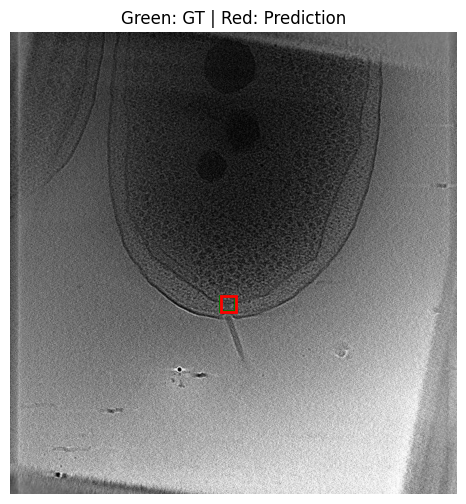

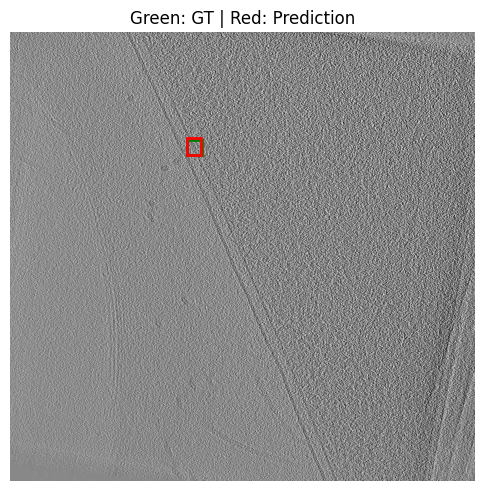

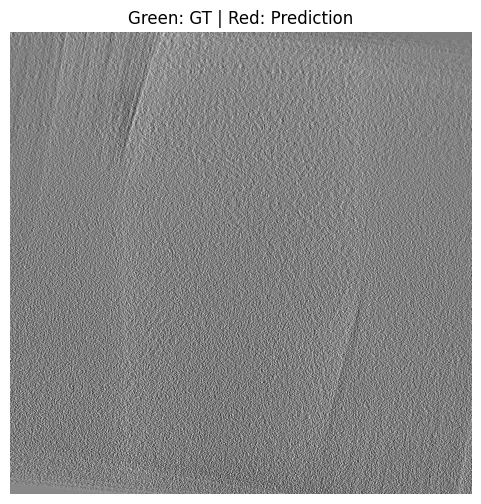

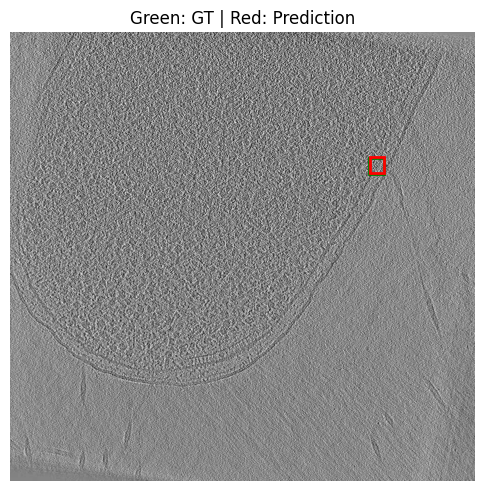

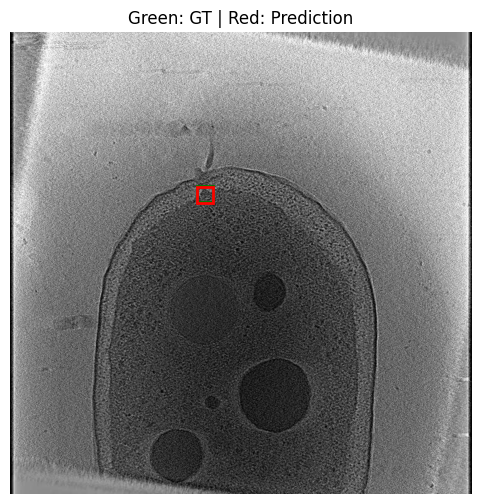

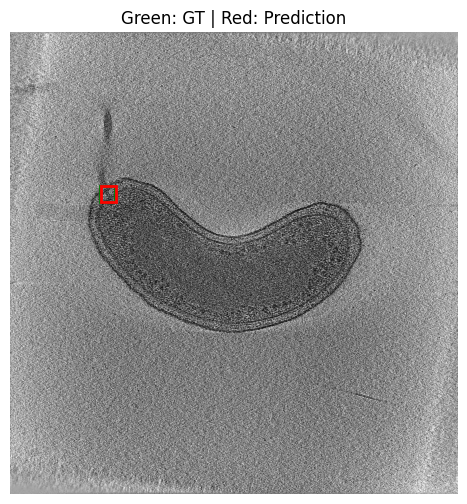

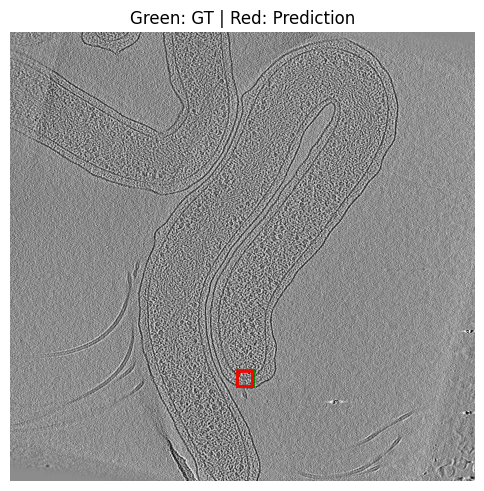

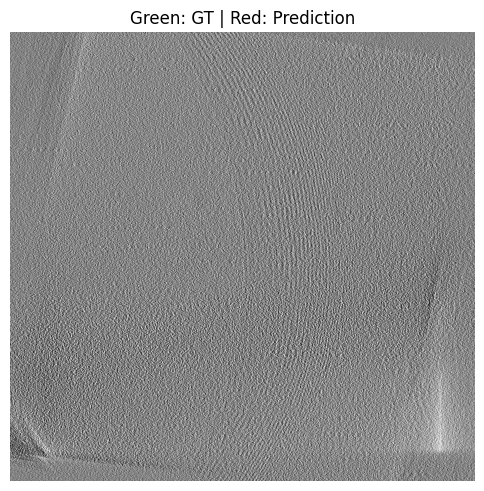

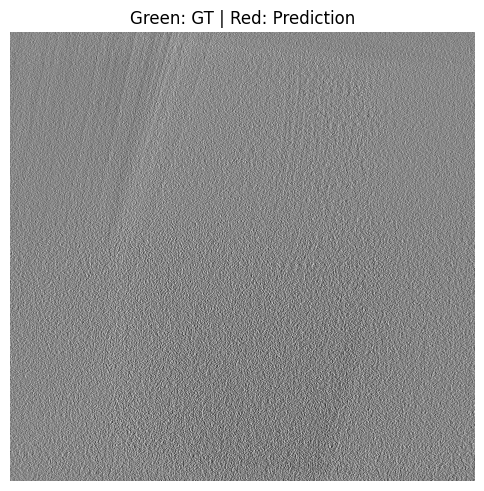

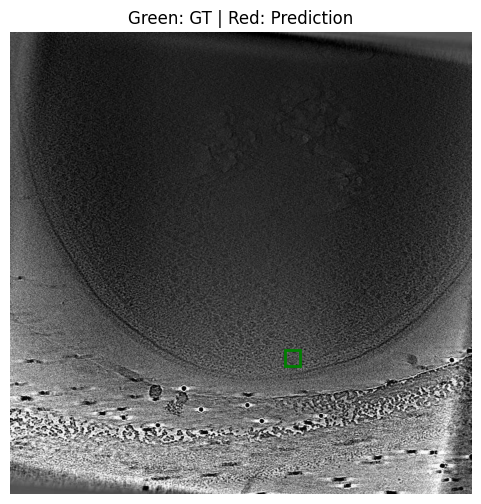

In [134]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

mean = 0.4832
std = 0.2180

def unnormalize(img, mean, std):
    """Unnormalize a torch tensor image for display (handles 1 or 3 channels)."""
    img = img.clone()
    if img.shape[0] == 1:  # Grayscale
        img = img * std + mean
        img = img[0].cpu().numpy()
    else:  # RGB
        for c in range(3):
            img[c] = img[c] * std + mean
        img = img.permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    return img

for i in range(10):
    img, _ = val_dataset[i]
    img_disp = unnormalize(img, mean, std)
    preds = all_outputs[i]
    gts = all_targets[i]

    plt.figure(figsize=(6, 6))
    # Display grayscale or RGB automatically
    if img_disp.ndim == 2:
        plt.imshow(img_disp, cmap='gray')
    else:
        plt.imshow(img_disp)

    ax = plt.gca()

    # Draw ground truth boxes (green)
    for box in gts['boxes']:
        ax.add_patch(patches.Rectangle(
            (box[0], box[1]), box[2]-box[0], box[3]-box[1],
            linewidth=2, edgecolor='g', facecolor='none'
        ))

    # Draw predicted boxes (red)
    for box in preds['boxes']:
        ax.add_patch(patches.Rectangle(
            (box[0], box[1]), box[2]-box[0], box[3]-box[1],
            linewidth=2, edgecolor='r', facecolor='none'
        ))

    plt.title("Green: GT | Red: Prediction")
    plt.axis("off")
    plt.show()


## Save Model

In [ ]:
'''
torch.save(model.state_dict(), "/content/drive/MyDrive/BacterialFlagellarMotorsData/fasterrcnn_motor_detector_2.pth")
''

## Run Inference

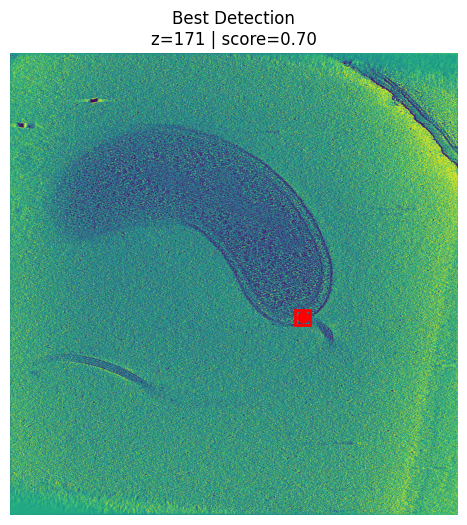

In [135]:
import os
import torch
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

def infer_motor_location(model, tomo_dir, device='cpu', score_threshold=0.5, show=True):
    """
    Infers the most likely motor location from a 3D tomogram and optionally visualizes it.

    Args:
        model (torch.nn.Module): Trained Faster R-CNN model.
        tomo_dir (str): Path to folder containing slice_XXXX.jpg images.
        device (str): 'cuda' or 'cpu'.
        score_threshold (float): Minimum score to accept a detection.
        show (bool): Whether to visualize the top detection.

    Returns:
        dict: Detection info or a message if none found.
    """
    model.to(device)
    model.eval()

    transform = transforms.ToTensor()
    best_detection = None
    best_image = None

    for slice_file in sorted(os.listdir(tomo_dir)):
        if not slice_file.endswith(".jpg"):
            continue

        try:
            z_index = int(slice_file.split("_")[1].split(".")[0])
        except Exception:
            continue

        img_path = os.path.join(tomo_dir, slice_file)
        image = Image.open(img_path).convert("L")
        img_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(img_tensor)[0]

        for box, score in zip(outputs["boxes"], outputs["scores"]):
            if score >= score_threshold:
                xmin, ymin, xmax, ymax = box.tolist()
                x_center = (xmin + xmax) / 2
                y_center = (ymin + ymax) / 2

                detection = {
                    "slice": slice_file,
                    "Motor axis 0": z_index,
                    "Motor axis 1": y_center,
                    "Motor axis 2": x_center,
                    "score": float(score),
                    "bbox": [xmin, ymin, xmax, ymax]
                }

                if best_detection is None or score > best_detection["score"]:
                    best_detection = detection
                    best_image = image.copy()

    if best_detection and show:
        fig, ax = plt.subplots(figsize=(6, 6))
        ax.imshow(best_image)
        xmin, ymin, xmax, ymax = best_detection["bbox"]
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   edgecolor='red', linewidth=2, fill=False))
        ax.scatter(best_detection["Motor axis 2"], best_detection["Motor axis 1"], color='red', s=60)
        ax.set_title(f"Best Detection\nz={best_detection['Motor axis 0']} | score={best_detection['score']:.2f}")
        plt.axis("off")
        plt.show()

    return best_detection if best_detection else {"message": "No confident detections found."}


# Test
test_1 = TEST_DIR + "/tomo_00e047"
test_1_inference = infer_motor_location(model, test_1, device=device)

test_2 = TEST_DIR + "/tomo_01a877"
test_2_inference = infer_motor_location(model, test_2, device=device)

test_3 = TEST_DIR + "/tomo_003acc"
test_3_inference = infer_motor_location(model, test_3, device=device)



## Run Inference (multiple motors)


In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt

def infer_motor_locations_mult(
    model,
    tomo_dir,
    voxel_spacing=1,
    device='cpu',
    score_threshold=0.5,
    min_dist=10,
    show=True
):
    """
    Infers the most likely motor locations (distinct) from a 3D tomogram.

    Args:
        model (torch.nn.Module): Trained Faster R-CNN model.
        tomo_dir (str): Path to folder containing slice_XXXX.jpg images.
        device (str): 'cuda' or 'cpu'.
        score_threshold (float): Minimum score to accept a detection.
        min_dist (float): Minimum distance between detected motors.
        show (bool): Whether to visualize the detections.

    Returns:
        list[dict]: List of confident, spatially-distinct detections.
    """
    model.to(device)
    model.eval()

    transform = transforms.ToTensor()
    detections = []

    # Collect all confident detections from all slices
    for slice_file in sorted(os.listdir(tomo_dir)):
        if not slice_file.endswith(".jpg"):
            continue
        try:
            z_index = int(slice_file.split("_")[1].split(".")[0])
        except Exception:
            continue

        img_path = os.path.join(tomo_dir, slice_file)
        image = Image.open(img_path).convert("RGB")
        img_tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(img_tensor)[0]

        for box, score in zip(outputs["boxes"], outputs["scores"]):
            if score >= score_threshold:
                xmin, ymin, xmax, ymax = box.tolist()
                x_center = (xmin + xmax) / 2
                y_center = (ymin + ymax) / 2

                detections.append({
                    "slice": slice_file,
                    "Motor axis 0": z_index,
                    "Motor axis 1": y_center,
                    "Motor axis 2": x_center,
                    "score": float(score),
                    "bbox": [xmin, ymin, xmax, ymax],
                    "image": image.copy()
                })

    if not detections:
        return [{"message": "No confident detections found."}]

    # Sort detections by score (desc)
    detections.sort(key=lambda d: d['score'], reverse=True)

    # Greedily select distinct locations (non-overlapping)
    unique_detections = []
    centers = []

    for det in detections:
        c = np.array([det['Motor axis 0'], det['Motor axis 1'], det['Motor axis 2']])
        if not centers or all(np.linalg.norm(c - other) >= min_dist for other in centers):
            unique_detections.append(det)
            centers.append(c)

    # Plot all unique detections if requested
    if show:
        for det in unique_detections:
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(det["image"])
            xmin, ymin, xmax, ymax = det["bbox"]
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                       edgecolor='red', linewidth=2, fill=False))
            ax.scatter(det["Motor axis 2"], det["Motor axis 1"], color='red', s=60)
            ax.set_title(f"Detection\nz={det['Motor axis 0']} | score={det['score']:.2f}")
            plt.axis("off")
            plt.show()

    # Remove image data before returning
    for det in unique_detections:
        det.pop("image")

    return unique_detections


In [ ]:
# Entry with multiple motors
test_mult = TRAIN_DIR + "/tomo_00e463"
test_mult_inference = infer_motor_locations_mult(model, test_mult, device=device, min_dist=7, score_threshold=0.99, show=True)

In [ ]:
detections = test_mult_inference

for i, det in enumerate(detections):
    print(f"\nDetection {i+1}:")
    for key, value in det.items():
        print(f"  {key}: {value}")

## Put Test Inference Into a DF

In [ ]:
# Add folder names
test_1_inference["tomo_id"] = os.path.basename(test_1)
test_2_inference["tomo_id"] = os.path.basename(test_2)
test_3_inference["tomo_id"] = os.path.basename(test_3)

# Convert to DataFrame
inference_results = [test_1_inference, test_2_inference, test_3_inference]
submission_df = pd.DataFrame(inference_results)

# Display
print(submission_df)

## Put True Test Into a DF

In [ ]:
# Load your full CSV (e.g. ground truth or solution)
solution_df = pd.read_csv(LABELS_PATH)

# Filter rows where 'tomo_id' matches any in your inference df
solution_df = solution_df[solution_df['tomo_id'].isin(submission_df['tomo_id'])]

# Order rows by 'tomo_id'
solution_df = solution_df.set_index('tomo_id').loc[submission_df['tomo_id']].reset_index()

# Change column name Number of motors -> Has motor
solution_df = solution_df.rename(columns={"Number of motors": "Has motor"})


# View or save
print(solution_df)


## Prepare DFs to Evaluate

In [ ]:
import pandas as pd

def standardize_and_validate_columns(solution_df, submission_df):
    expected_solution_cols = [
        "tomo_id", "Motor axis 0", "Motor axis 1", "Motor axis 2", "Voxel spacing", "Has motor"
    ]
    expected_submission_cols = [
        "tomo_id", "Motor axis 0", "Motor axis 1", "Motor axis 2"
    ]

    # Filter to only the expected columns (if extras exist)
    solution_df = solution_df[expected_solution_cols].copy()
    submission_df = submission_df[expected_submission_cols].copy()

    # Validate that all required columns exist
    if not all(col in solution_df.columns for col in expected_solution_cols):
        raise ValueError("Missing required columns in solution DataFrame")

    if not all(col in submission_df.columns for col in expected_submission_cols):
        raise ValueError("Missing required columns in submission DataFrame")

    return solution_df, submission_df

solution_df, submission_df = standardize_and_validate_columns(solution_df, submission_df)

print(solution_df)
print(submission_df)


## BYU Evaluation Metric

In [ ]:
import sklearn.metrics
import numpy as np


class ParticipantVisibleError(Exception):
    # If you want an error message to be shown to participants, you must raise the error as a ParticipantVisibleError
    # All other errors will only be shown to the competition host. This helps prevent unintentional leakage of solution data.
    pass


def distance_metric(
    solution: pd.DataFrame,
    submission: pd.DataFrame,
    thresh_ratio: float,
    min_radius: float,
):
    coordinate_cols = ['Motor axis 0', 'Motor axis 1', 'Motor axis 2']
    label_tensor = solution[coordinate_cols].values.reshape(len(solution), -1, len(coordinate_cols))
    predicted_tensor = submission[coordinate_cols].values.reshape(len(submission), -1, len(coordinate_cols))
    # Find the minimum euclidean distances between the true and predicted points
    solution['distance'] = np.linalg.norm(label_tensor - predicted_tensor, axis=2).min(axis=1)
    # Convert thresholds from angstroms to voxels
    solution['thresholds'] = solution['Voxel spacing'].apply(lambda x: (min_radius * thresh_ratio) / x)
    solution['predictions'] = submission['Has motor'].values
    solution.loc[(solution['distance'] > solution['thresholds']) & (solution['Has motor'] == 1) & (submission['Has motor'] == 1), 'predictions'] = 0
    return solution['predictions'].values

def score(solution: pd.DataFrame, submission: pd.DataFrame, min_radius: float, beta: float) -> float:
    """
    Parameters:
    solution (pd.DataFrame): DataFrame containing ground truth motor positions.
    submission (pd.DataFrame): DataFrame containing predicted motor positions.

    Returns:
    float: FBeta score.

    Example
    --------
    >>> solution = pd.DataFrame({
    ...     'tomo_id': [0, 1, 2, 3],
    ...     'Motor axis 0': [-1, 250, 100, 200],
    ...     'Motor axis 1': [-1, 250, 100, 200],
    ...     'Motor axis 2': [-1, 250, 100, 200],
    ...     'Voxel spacing': [10, 10, 10, 10],
    ...     'Has motor': [0, 1, 1, 1]
    ... })
    >>> submission = pd.DataFrame({
    ...     'tomo_id': [0, 1, 2, 3],
    ...     'Motor axis 0': [100, 251, 600, -1],
    ...     'Motor axis 1': [100, 251, 600, -1],
    ...     'Motor axis 2': [100, 251, 600, -1]
    ... })
    >>> score(solution, submission, 1000, 2)
    0.3571428571428571
    """

    solution = solution.sort_values('tomo_id').reset_index(drop=True)
    submission = submission.sort_values('tomo_id').reset_index(drop=True)

    filename_equiv_array = solution['tomo_id'].eq(submission['tomo_id'], fill_value=0).values

    if np.sum(filename_equiv_array) != len(solution['tomo_id']):
        raise ValueError('Submitted tomo_id values do not match the sample_submission file')

    submission['Has motor'] = 1
    # If any columns are missing an axis, it's marked with no motor
    select = (submission[['Motor axis 0', 'Motor axis 1', 'Motor axis 2']] == -1).any(axis='columns')
    submission.loc[select, 'Has motor'] = 0

    cols = ['Has motor', 'Motor axis 0', 'Motor axis 1', 'Motor axis 2']
    assert all(col in submission.columns for col in cols)

    # Calculate a label of 0 or 1 using the 'has motor', and 'motor axis' values
    predictions = distance_metric(
        solution,
        submission,
        thresh_ratio=1.0,
        min_radius=min_radius,
    )

    return sklearn.metrics.fbeta_score(solution['Has motor'].values, predictions, beta=beta)

score_value = score(solution_df, submission_df, min_radius=1000, beta=2)
print(f"F2 Score: {score_value:4f}")


## Compute mean and std of dataset

In [106]:
# Compute mean and std of data set

'''
import torch
from torchvision import transforms
from PIL import Image
import os
from tqdm import tqdm

def compute_mean_std(image_dir, image_ext='.jpg', grayscale=False, max_images=None):
    """
    Computes mean and std of all images in a directory and its subdirectories.

    Args:
        image_dir (str): Root path containing tomogram subfolders.
        image_ext (str): Image file extension (default '.jpg').
        grayscale (bool): Set True for single-channel images.
        max_images (int or None): Limit number of images to process.

    Returns:
        mean (list): Per-channel mean.
        std (list): Per-channel std.
    """
    to_tensor = transforms.ToTensor()
    file_list = []
    # Recursively find all images in subfolders
    for root, dirs, files in os.walk(image_dir):
        for fname in files:
            if fname.endswith(image_ext):
                file_list.append(os.path.join(root, fname))
    if max_images:
        file_list = file_list[:max_images]

    if len(file_list) == 0:
        raise ValueError(f"No images with extension {image_ext} found in {image_dir} or its subfolders!")

    channel_sum = None
    channel_squared_sum = None
    n_pixels = 0

    for img_path in tqdm(file_list, desc="Processing images"):
        img = Image.open(img_path)
        if grayscale:
            img = img.convert('L')  # single channel
        else:
            img = img.convert('RGB')
        img_tensor = to_tensor(img)
        if channel_sum is None:
            channel_sum = torch.zeros(img_tensor.shape[0])
            channel_squared_sum = torch.zeros(img_tensor.shape[0])
        n_pixels += img_tensor.shape[1] * img_tensor.shape[2]
        channel_sum += img_tensor.sum(dim=[1, 2])
        channel_squared_sum += (img_tensor ** 2).sum(dim=[1, 2])

    mean = (channel_sum / n_pixels).tolist()
    std = ((channel_squared_sum / n_pixels - torch.tensor(mean) ** 2).sqrt()).tolist()
    return mean, std


mean, std = compute_mean_std(TRAIN_DIR, grayscale=True, max_images=10000)
print(f"Mean: {mean}, Std: {std}")
'''